In [1]:
from astropy.io import fits
from astropy.io import ascii
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Column, Table, vstack
import tarfile
import os
import glob
from pathlib import Path
from scipy import interpolate
from scipy.interpolate import InterpolatedUnivariateSpline
import pdb

In [2]:
#random galaxy sample
hdul4 = fits.open('mangaHI-8243-3701-Copy1.fits')
hdul4.info()
hdu4 = hdul4[1]
hdr4 = hdul4[0].header 
hdr4 = hdul4[1].header
data4 = hdu4.data
cols4 = data4.columns
hdul4.close()
print(hdr4)

Filename: mangaHI-8243-3701-Copy1.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     39   1R x 3C   [940E, 940E, 940E]   
XTENSION= 'BINTABLE'           /Written by IDL:  Wed Mar 28 16:48:38 2018       BITPIX  =                    8 /                                                NAXIS   =                    2 /Binary table                                    NAXIS1  =                11280 /Number of bytes per row                         NAXIS2  =                    1 /Number of rows                                  PCOUNT  =                    0 /Random parameter count                          GCOUNT  =                    1 /Group count                                     TFIELDS =                    3 /Number of columns                               COMMENT                                                                         COMMENT  *** End of mandatory fields ***              

In [28]:
#random scaling factor manual computation using galv from respective file instead of using nsa_zdist calc
scalefactor = 2.36e5*((184.49857)**2)*(1/(9.75442e9))*(1/((1.86/1000)**2))
print(scalefactor)

0.8235624947831439


In [3]:
feel_location = os.path.join('/Users/Frank/KNAC_Internship/all_spectra', '**/*.fits')
feel_names = glob.glob(feel_location)
print('Only 4592 of these spectra files use SDSS plate-ifu naming convention.')

Only 4592 of these spectra files use SDSS plate-ifu naming convention.


In [4]:
drip_location = os.path.join('/Users/Frank/KNAC_Internship/ALL_samples_spectra', '*.fits')
drip_names = glob.glob(drip_location)
print(len(drip_names))

741


In [5]:
#red geyser sample drp info, but without the geyser that is not in gbt/alfalfa data
hdul1 = fits.open('joined_table_final.fits')
hdul1.info()
hdu1 = hdul1[1]
hdr1 = hdul1[0].header 
hdr1 = hdul1[1].header
data1 = hdu1.data
cols = data1.columns
hdul1.close()

Filename: joined_table_final.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      16   (9055,)   uint8   
  1  Joined        1 BinTableHDU    259   50R x 122C   [K, 32A, 32A, 9A, 32A, 32A, 32A, 32A, 32A, 32A, 32A, D, D, D, D, D, D, D, K, D, K, D, D, 53A, K, 32A, K, D, D, D, D, D, D, D, D, D, D, D, K, K, K, D, D, D, D, K, K, K, K, 32A, K, 19A, K, K, K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, K, K, K, 6A, K, K, D, D, 7D, 7D, 7D, D, D, D, D, 7D, D, D, 7D, 7D, 7D, 7D, D, D, D, D, 7D, 7D, E, 79A, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E]   


In [6]:
#control sample drp info, but without 8 galaxies that aren't in gbt/alfalfa data
hdul = fits.open('controlll-take-22-final.fits')
hdul.info()
hdu = hdul[1]
hdr = hdul[0].header 
hdr = hdul[1].header
data = hdu.data
cols = data.columns
hdul.close()

Filename: controlll-take-22-final.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      16   (5910,)   uint8   
  1  /Users/Frank/Desktop/KNAC_internship/controlll-take-22.fits#1    1 BinTableHDU    252   691R x 120C   [32A, 9A, 32A, 32A, 32A, 32A, 32A, 32A, D, D, D, D, D, D, D, K, D, K, D, D, 53A, K, 32A, K, D, D, D, D, D, D, D, D, D, D, D, K, K, K, D, D, D, D, K, K, K, K, 32A, K, 19A, K, K, K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, K, K, K, 6A, K, K, D, D, 7D, 7D, 7D, D, D, D, D, 7D, D, D, 7D, 7D, 7D, 7D, D, D, D, D, 7D, 7D, E, 79A, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, D]   


In [7]:
geys_location = os.path.join('/Users/Frank/KNAC_Internship/geyser_sample_spectra', '*.fits')
geys_names = glob.glob(geys_location)
print(len(geys_names))

cont_location = os.path.join('/Users/Frank/KNAC_Internship/control_sample_spectra', '*.fits')
cont_names = glob.glob(cont_location)
print(len(cont_names))

50
691


In [8]:
def read_spec(filnam): 
    sp = fits.open(filnam)
    s = sp[1]
    datat = s.data
    header = sp[1].header #; can use to pull out header data later if I want
    
    galv = header['OBJ_VEL']
    
    flux = datat['FHI']
    
    vel = datat['VHI']
    
    corrected_vel = vel-galv
    
    sp.close()
    
    return vel, flux, galv, corrected_vel

In [9]:
#drpall file with ALL samples spectra info
hdul7 = fits.open('all-spec-info-final.fits')
hdul7.info()
hdu7 = hdul7[1]
hdr7 = hdul7[0].header 
hdr7 = hdul7[1].header
data7 = hdu7.data
cols = data7.columns
hdul7.close()

Filename: all-spec-info-final.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      16   (6150,)   uint8   
  1  Joined        1 BinTableHDU    212   741R x 100C   [11A, K, 32A, 32A, 32A, 32A, 32A, 32A, 32A, 32A, 32A, 32A, D, D, D, D, D, D, D, K, D, K, D, D, 53A, K, 32A, K, D, D, D, D, D, D, D, D, D, D, D, K, K, K, D, D, D, D, K, K, K, K, 32A, K, 19A, K, K, K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, K, K, K, 6A, K, K, D, D, 7D, 7D, 7D, D, D, D, D, 7D, D, D, 7D, 7D, 7D, 7D, D, D, D, D, 7D, 7D]   


In [10]:
#running this loop/function here specifically to get galv of red geyser sample to use in distance calculation in following cell
redgalv_list = []
for f in geys_names: #goes through and pulls out VHI and FHI and galaxy velocity
    vel, flux, redgalv, corrected_vel = read_spec(f)
    redgalv_list.append(redgalv)
    
redgalv_arr = np.array(redgalv_list)
print(len(redgalv_arr))

50


In [11]:
#flux scaling red geyser calculations into notebook
c = 3e5 #km/s
H = 70 #km/s/Mpc
tebl = Table()
tebl['MANGAID'] = data1['plateifu_1']
tebl['M*'] = data1['nsa_elpetro_mass']
tebl['Distance [Mpc]'] = (data1['nsa_zdist'])*((3e5)/(70))
p=(data1['nsa_zdist'])*((3e5)/(70)) #distance calculation using nsa data
t=redgalv_arr/70 #distance calculation using hubble law
tebl['Scale for Flux'] = (2.36e5*((t)**2))/(data1['nsa_elpetro_mass']) #scaling factor for distance
tebl['RMS'] = 1/(((data1['RMS'])/1000)**2) #converted mJy to Jy, scaling factor for noise

#tebl.remove_row(25) #removing galaxy that disappeared in gbt/alfalfa data

np.set_printoptions(threshold=np.inf)
dat = np.array(tebl['Scale for Flux']) #distance weight
fat = np.array(tebl['RMS']) #rms weight 
wsum = np.sum(fat) #sum of rms weights to divide by later on in stacking loop
print(len(dat))
print(wsum)
print(fat)

50
16494713.0
[166257.16  317679.1   498845.5   382447.    452215.8   451470.75
 138704.39  246047.5     5820.402 550126.06  400045.2   340969.94
 350741.8   344398.12  240292.14  635612.7   147873.48  122509.695
 170786.84  289050.78  339598.28  281733.28  680761.1   386279.72
 188380.1   339598.28  130500.305 292816.8   134698.62  454617.53
 502209.    354397.44  177136.1   355081.53  507301.    353752.3
 376163.22  349310.1   595594.75  255757.72   73538.086 451418.2
 409717.7   489551.5   381834.62  414085.56  163211.25  214895.47
 315461.94  273418.25 ]


In [12]:
tebl.show_in_notebook()
print('Using galv from random galaxy to determine scaling factor: 0.8235624947831439 instead of the NSA_ZDIST calculation: 0.8375535495922247.')

Using galv from random galaxy to determine scaling factor: 0.8235624947831439 instead of the NSA_ZDIST calculation: 0.8375535495922247.


In [13]:
#running this loop/function here specifically to get galv of control sample to use in distance calculation in following cell
contgalv_list = []
for f in cont_names: #goes through and pulls out VHI and FHI and galaxy velocity
    vel, flux, contgalv, corrected_vel = read_spec(f)
    contgalv_list.append(contgalv)
    
contgalv_arr = np.array(contgalv_list)
print(len(contgalv_arr))

691


In [14]:
#flux scaling control calculations into notebook
c = 3e5 #km/s
H = 70 #km/s/Mpc
teebl = Table()
teebl['MANGAID'] = data['plateifu_1_2']
teebl['M*'] = data['nsa_elpetro_mass_2']
teebl['Distance [Mpc]'] = (data['nsa_zdist_2'])*((3e5)/(70))
p1=(data['nsa_zdist_2'])*((3e5)/(70)) #distance calculation using nsa data
t1= contgalv_arr/70 #distance calculation using hubble law
teebl['Scale for Flux'] = (2.36e5*((t1)**2))/(data['nsa_elpetro_mass_2']) #scaling factor for distance
teebl['RMS'] = 1/(((data['RMS'])/1000)**2) #converted mJy to Jy, scaling factor for noise
#teebl.remove_row(49)
#teebl.remove_row(178)
#teebl.remove_row(242)
#teebl.remove_row(262)
#teebl.remove_row(373)
#teebl.remove_row(374)
#teebl.remove_row(405)
#teebl.remove_row(532)
#tebl.show_in_notebook()

np.set_printoptions(threshold=np.inf)
dat2 = np.array(teebl['Scale for Flux']) #distance weight
fat2 = np.array(teebl['RMS']) #rms weight
wsum2 = np.sum(fat2) #sum of rms weights to divide by in stacking loop later
print(len(dat2))
print(wsum2)

691
188949500.0


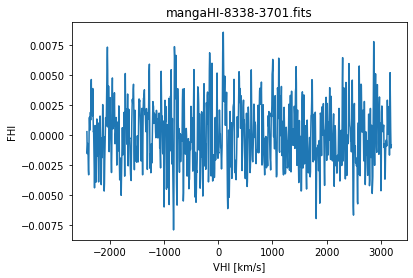

In [13]:
#plotting original (unscaled flux and velocity) samples data
for f in drip_names: #goes through and pulls out VHI and FHI and galaxy velocity
    vel, flux, galv, corrected_vel = read_spec(f)
    x = corrected_vel
    y = flux
    for i in range(len(x)):
        plt.figure()
        plt.plot(x[i],y[i])
        fname = os.path.basename(f)
        plt.title(fname)
        plt.xlabel('VHI [km/s]')
        plt.ylabel('FHI')
    # Figures not saved yet
        plt.show()
        plt.close()
    break

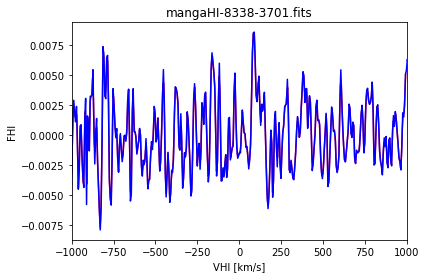

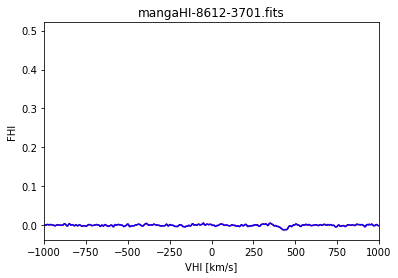

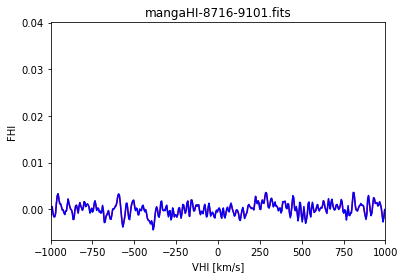

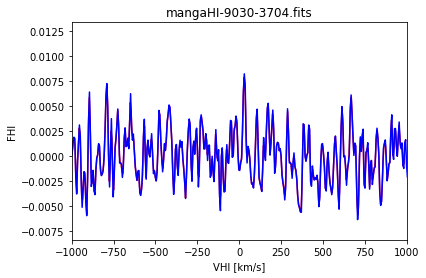

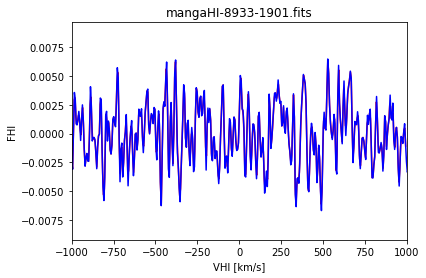

...

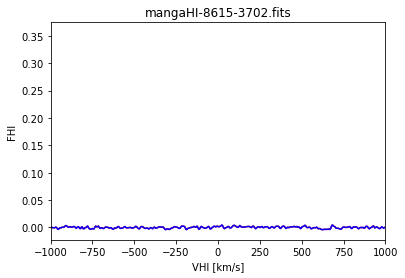

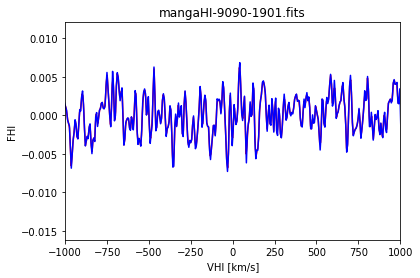

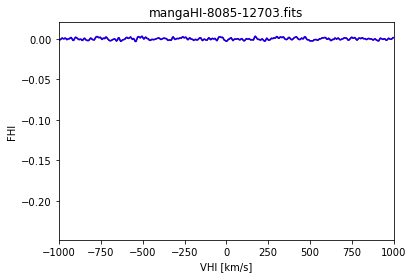

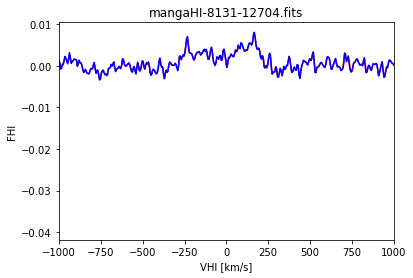

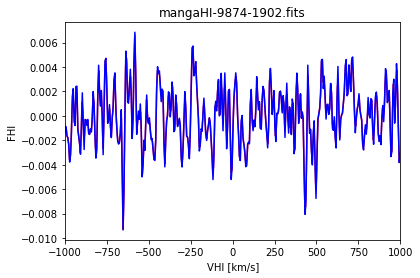

KeyboardInterrupt: 

In [15]:
#interpolating all data onto same coordinate system but with different interpolate command
#ALSO OVERPLOTS ORIGINAL AND INTERPOLATED DATA
d = []
for f in drip_names: #goes through and pulls out VHI and FHI and galaxy velocity
    vel, flux, galv, corrected_vel = read_spec(f)
    corrected_vel2 = corrected_vel
    yeet=flux
    for p in corrected_vel2:
        for q in yeet:
            int_func = interpolate.interp1d(p,q,fill_value="extrapolate")
            new_x2 = np.arange(-1000,1000,5)
            new_y2 = int_func(new_x2)
            d.append(new_y2)
            figg = plt.figure()
            ax1 = figg.add_subplot(111)
            ax1.plot(new_x2,new_y2, color = 'red')
            ax1.plot(p,q, color = 'blue')
            plt.xlim(-1000,1000)
            fname = os.path.basename(f)
            plt.title(fname)
            plt.xlabel('VHI [km/s]')
            plt.ylabel('FHI')
            plt.show()
            plt.close()
            break

# disclaimer: this is using rms as a VELOCITY scaling factor-- ie interpolate samples using scaled_vel_arr 's as x input

In [15]:
#scaling velocity by noise (rms) red geyser edition
scaled_vel_arr = [] #scaled by 1/RMS^2
for f in drip_names:
    vel, flux, galv, corrected_vel = read_spec(f)
    z = corrected_vel
for i in range(len(z)): #where z is original corrected_vel matrix
    scaled_vel = (z[i])*(fat[i])
    scaled_vel_arr.append(scaled_vel)
    #print(scaled_vel_arr)
    #break

## disclaimer: using rms as a FLUX scaling factor means using qmark[i] instead of dat[i] in existing flux scaling loops for each sample below

In [16]:
#stacking geysers

#interpolating through the red geyser flux
e = [] #where new interpolated flux matrix will go
for f in geys_names:
    vel, flux, galv, corrected_vel = read_spec(f)
    xee = corrected_vel
    yee=flux
    for p in xee:
        for q in yee:
            int_func = interpolate.interp1d(p,q,fill_value="extrapolate")
            geysx = np.arange(-1000,1000,5)
            geysy = int_func(geysx)
            e.append(geysy)


#scaling for distance loop
scaled_flux_arr2 = []
for i in range(len(e)):
    scaled_flux = (e[i])*(dat[i])
    scaled_flux_arr2.append(scaled_flux)

#scaling for rms weights loop
scaled_fluxx_arr2 = []
for i in range(len(scaled_flux_arr2)):
    scaled_fluxx = (scaled_flux_arr2[i])*(fat[i])
    scaled_fluxx_arr2.append(scaled_fluxx)

#stacking loop
stacked_flux_arr2 = []
for i in range(len(e[0])):
    tot1 = (np.sum([l[i] for l in scaled_fluxx_arr2]))/wsum 
    stacked_flux_arr2.append(tot1)

In [129]:
#print(stacked_flux_arr2)

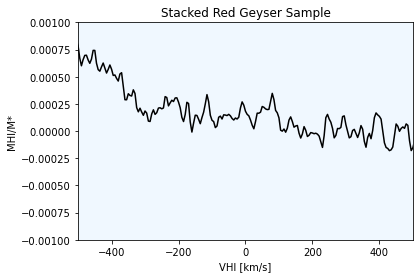

In [17]:
#plotting stacked red geyser sample
geysstackfig = plt.figure()
ax1 = geysstackfig.add_subplot(111)
ax1.set_facecolor("aliceblue")
arbx1 = np.arange(-1000,1000,5)
ax1.plot(arbx1,stacked_flux_arr2, color = 'k')
plt.xlim(-500,500)
plt.ylim(-0.001,0.001)
plt.title('Stacked Red Geyser Sample')
plt.xlabel('VHI [km/s]')
plt.ylabel('MHI/M*')
plt.savefig('stacked geysers.png', bbox_inches='tight')
plt.show()
plt.close()

##note that the ratio is incredibly small numbers; not unlike Roberts-Borsani et al 2019

In [20]:
#calculate final rms noise to find upper limit on HI mass

#limit flux to -200 to 400 range since it's relatively flat
a=np.array(stacked_flux_arr2)
flatmask = (arbx1 > -200) & (arbx1 < 400)
flatflux = a[flatmask]
#print(flatflux) #... I don't know how python knows which VHI are associated with what spectrum value because other than the plot, I didn't explicitly link them
print(len(flatflux)) #this at least makes sense considering the fraction of arbx1 I'm pulling

#calculate standard deviation across this range
rmsdev = np.std(flatflux)
print('Standard deviation across red geyser stacked spectra from -200 to 400 VHI is',rmsdev)

#upper limit calc
dV = 10 #[km/s] does this come from GBT data?
W = 200 #[km/s] assumed linewidth of our galaxies
uplim = 3*rmsdev*dV*(np.sqrt(W/dV)) #"The factor of 3 is just to to be conservative...we tend to quote upper limits as 3 times the noise level." -Dave
print('The average red geyser has an HI-to-stellar-mass ratio less than',uplim, '[M_sun.]')

119
Standard deviation across red geyser stacked spectra from -200 to 400 VHI is 0.00010317029537830541
The average red geyser has an HI-to-stellar-mass ratio less than 0.013841747623477396 [M_sun.]


In [21]:
#stacking control sample
g = []
for f in cont_names: #goes through and pulls out VHI and FHI and galaxy velocity
    vel, flux, galv, corrected_vel = read_spec(f)
    xee1 = corrected_vel
    yee1=flux
    for p in xee1:
        for q in yee1:
            int_func = interpolate.interp1d(p,q, fill_value="extrapolate")
            contx = np.arange(-1000,1000,5)
            conty = int_func(contx)
            g.append(conty)


#scaling for distance loop
scaled_flux_arr3 = []
for i in range(len(g)):
    scaled_flux = (g[i])*(dat2[i])
    scaled_flux_arr3.append(scaled_flux)

#scaling for rms weights loop (what i need to take out to change it back)
scaled_fluxx_arr3 = []
for i in range(len(scaled_flux_arr3)):
    scaled_fluxx = (scaled_flux_arr3[i])*(fat2[i])
    scaled_fluxx_arr3.append(scaled_fluxx)

#stacking flux loop
stacked_flux_arr3 = []
for i in range(len(g[0])):
    tot2 = (np.sum([l[i] for l in scaled_fluxx_arr3]))/wsum2
    stacked_flux_arr3.append(tot2)

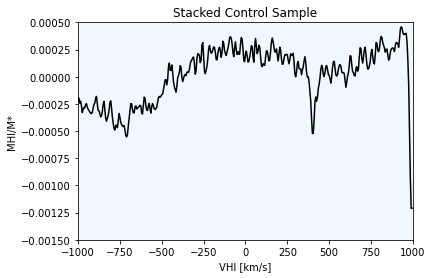

In [22]:
#plotting stacked control sample
contstackfig = plt.figure()
ax1 = contstackfig.add_subplot(111)
ax1.set_facecolor("aliceblue")
arbx = np.arange(-1000,1000,5)
ax1.plot(arbx,stacked_flux_arr3, color = 'k')
plt.xlim(-1000,1000)
plt.ylim(-0.0015,0.0005)
plt.title('Stacked Control Sample')
plt.xlabel('VHI [km/s]')
plt.ylabel('MHI/M*')
plt.savefig('stacked control.png', bbox_inches='tight')
plt.show()
plt.close()

In [24]:
#calculate final rms noise to find upper limit on HI mass control sample

#limit flux to -200 to 400 range since it's relatively flat
a2=np.array(stacked_flux_arr3)
flatmask2 = (arbx1 > -225) & (arbx1 < 225)
flatflux2 = a2[flatmask2]
#print(flatflux) #... I don't know how python knows which VHI are associated with what spectrum value because other than the plot, I didn't explicitly link them
print(len(flatflux)) #this at least makes sense considering the fraction of arbx1 I'm pulling

#calculate standard deviation across this range
rmsdev2 = np.std(flatflux2)
print('Standard deviation across control stacked spectra from -200 to 400 VHI is',rmsdev)

#upper limit calc
dV = 10 #[km/s] does this come from GBT data?
W = 200 #[km/s] assumed linewidth of our galaxies
uplim2 = 3*rmsdev2*dV*(np.sqrt(W/dV)) #"The factor of 3 is just to to be conservative...we tend to quote upper limits as 3 times the noise level." -Dave
print('The average control sample galaxy has an HI-to-stellar-mass ratio less than',uplim2, '[M_sun.]')

119
Standard deviation across control stacked spectra from -200 to 400 VHI is 0.00010317029537830541
The average control sample galaxy has an HI-to-stellar-mass ratio less than 0.008861651130211892 [M_sun.]


In [21]:
#want red geyser scaled flux
r = []
for f in geys_names: #goes through and pulls out VHI and FHI and galaxy velocity
    vel, flux, galv, corrected_vel = read_spec(f)
    xee = corrected_vel
    yee=flux
    for p in xee:
        for q in yee:
            int_func = interpolate.interp1d(p,q,fill_value="extrapolate")
            geysx = np.arange(-1000,1000,5)
            geysy = int_func(geysx)
            r.append(geysy)
            
scaled_flux_arr4 = []

#scaling flux loop
for i in range(len(r)):
    scaled_flux = (r[i])*(dat[i])
    scaled_flux_arr4.append(scaled_flux)

ValueError: x and y must have same first dimension, but have shapes (1,) and (400,)

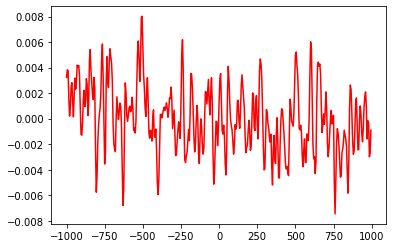

In [23]:
#plot all red geyser sample to check for ~weird~ graphs
for p in geysx:
        for q in scaled_flux_arr4:
            figg = plt.figure()
            ax1 = figg.add_subplot(111)
            ax1.plot(new_x2,new_y2, color = 'red')
            ax1.plot(p,q, color = 'blue')
            plt.xlim(-1000,1000)
            fname = os.path.basename(f)
            plt.title(fname)
            plt.xlabel('VHI [km/s]')
            plt.ylabel('FHI')
            plt.show()
            plt.close()
            

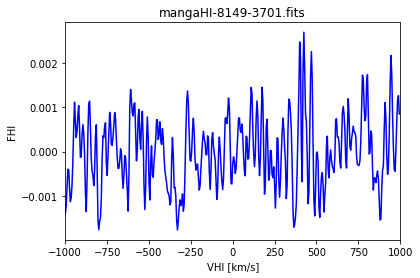

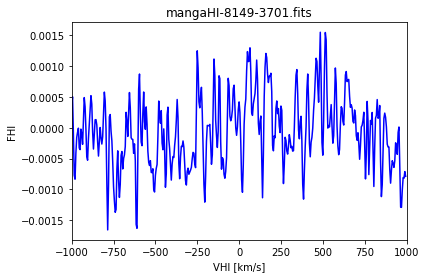

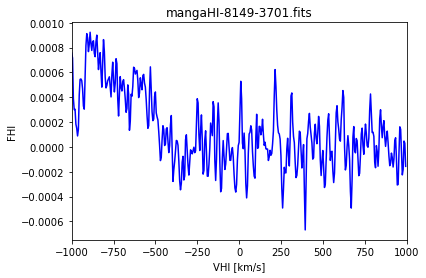

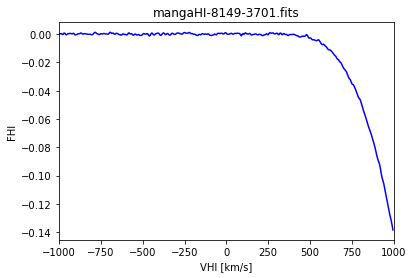

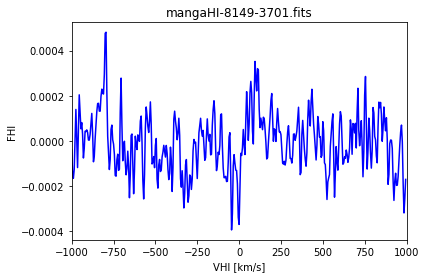

...

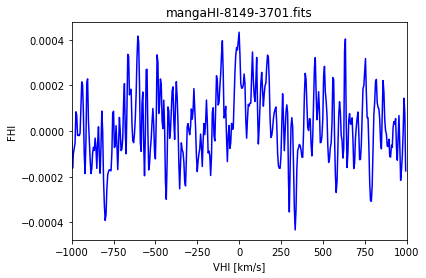

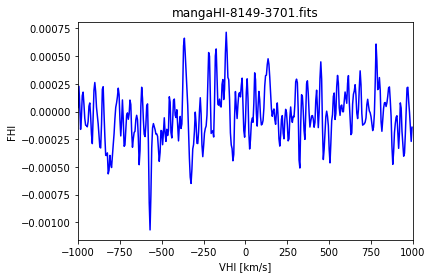

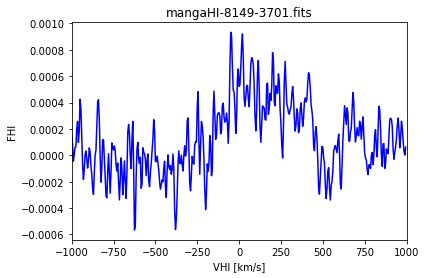

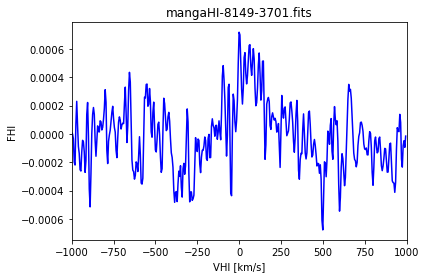

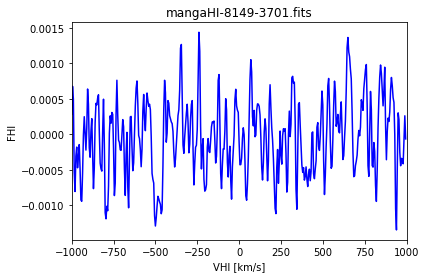

In [26]:
for y in scaled_flux_arr4:
    figg = plt.figure()
    ax1 = figg.add_subplot(111)
    ax1.plot(geysx,y, color = 'blue')
    plt.xlim(-1000,1000)
    fname = os.path.basename(f)
    plt.title(fname)
    plt.xlabel('VHI [km/s]')
    plt.ylabel('FHI')
    plt.show()
    plt.close()